# (15) results: temp

**Motivation**: Explore the effect of T_stop, using the new ```vH16``` dataset. Take a look at the results. <br>

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-vae/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-vae/figs')
tmp_dir = os.path.join(git_dir, 'jb-vae/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, '_PoissonVAE'))
from figures.fighelper import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

## Setup

In [2]:
device_idx = 1
device = f'cuda:{device_idx}'

from analysis.final import sort_fits, analyze_fits, load_quick
from analysis.loggabor import fit_loggabor
from figures.imgs import plot_weights, make_grid
from figures.theta import plot_theta


def fit_norm(data):
    rv = sp_stats.norm(*sp_stats.norm.fit(data))
    ks_test = sp_stats.kstest(
        rvs=data,
        cdf='norm',
        args=(rv.mean(), rv.std()),
    )
    return rv, ks_test


def plot_kl_log_rates(dead_thres = None):
    fig, axes = create_figure(1, 3, (10, 2), width_ratios=[2, 1.5, 1.5])
    
    # plot kl
    bins = np.linspace(0, 185, 186)
    sns.histplot(loss['kl_diag'][~dead] * 1000, bins=bins, stat='count', color='dimgrey', label='alive', ax=axes[0])
    sns.histplot(loss['kl_diag'][dead] * 1000, bins=bins, stat='count', color='r', label='dead', ax=axes[0])
    if dead_thres is not None:
        axes[0].axvline(dead_thres * 1000, color='r', ls='--', alpha=0.6)
    axes[0].locator_params(axis='x', nbins=7)
    axes[0].set_title('kl_diag')
    
    # fit log normal
    rv, ks_test = fit_norm(prior_log_rate[~dead])
    xs = np.linspace(
        start=rv.ppf(1e-5),
        stop=rv.ppf(1 - 1e-5),
        num=10000,
    )
    pdf = rv.pdf(xs)

    # plot prior rates + log normal fit
    sns.histplot(prior_log_rate[~dead], stat='density', color=sns.color_palette('muted')[0], label=r'$\log r$', ax=axes[1])
    axes[1].plot(xs, pdf, color='r', lw=2, ls='--', label=f'fit (p={ks_test.pvalue:1.1g})')
    axes[1].locator_params(axis='x', nbins=7)
    axes[1].set_title('log prior rate')
    
    sns.histplot(prior_log_rate[~dead], stat='count', color=sns.color_palette('muted')[0], label='alive', kde=True, ax=axes[2])
    sns.histplot(prior_log_rate[dead], stat='count', color='r', label='dead', kde=True, ax=axes[2])
    axes[2].locator_params(axis='x', nbins=7)
    axes[2].set(title='log prior rate') # , yscale='log')
    
    for ax in axes.flat:
        ax.set(ylabel='')
        ax.legend(fontsize=10)
    plt.show()


def perform_test(key: str = 'prior_rate', log: bool = True):
    # key = 'prior_rate' if tr.model.cfg.fit_prior else 'kl'
    try:
        rates_cardinal = results.loc[(results['label'] == 'cardinal') & ~dead, key].values
        rates_oblique = results.loc[(results['label'] == 'oblique') & ~dead, key].values
        if log:
            rates_cardinal, rates_oblique = map(
                np.log, [rates_cardinal, rates_oblique])
        u_test = sp_stats.mannwhitneyu(rates_cardinal, rates_oblique, method='auto')
        t_test = sp_stats.ttest_ind(rates_cardinal, rates_oblique, equal_var=True)
        a, b = len(rates_cardinal), len(rates_oblique)
        cardinal_ratio = a / (a+b)
        return u_test, t_test, cardinal_ratio
    except KeyError:
        return

In [3]:
def accept_fn(name):
    archi = name.split('-')[1]
    accept = (
        archi in ['<lin|lin>', '<mlp+b|lin>']
        and '-b' not in name
    )
    return accept


root = 'Dropbox/chkpts/PoissonVAE'
fits, fits_st, fits_etc = sort_fits(root)
fits = sorted(filter(accept_fn, fits))

msg = ' ——— '.join([
    f"# fits: {len(fits)}",
    f"# fits_st: {len(fits_st)}",
    f"# fits_etc: {len(fits_etc)}",
])
print(msg)

# fits: 120 ——— # fits_st: 0 ——— # fits_etc: 0

## Temp results

### Prepare df

In [4]:
%%time

analysis_mode = 'temp'
file_name = f"df_{analysis_mode}"

try:
    df = pjoin(tmp_dir, f"{file_name}.df")
    df = pd.read_pickle(df)
except FileNotFoundError:
    df = analyze_fits(fits, device, analysis_mode)
    save_obj(
        obj=df,
        file_name=file_name,
        save_dir=tmp_dir,
        verbose=True,
        mode='df',
    )

CPU times: user 1.66 ms, sys: 959 µs, total: 2.62 ms
Wall time: 2.23 ms


### make plots

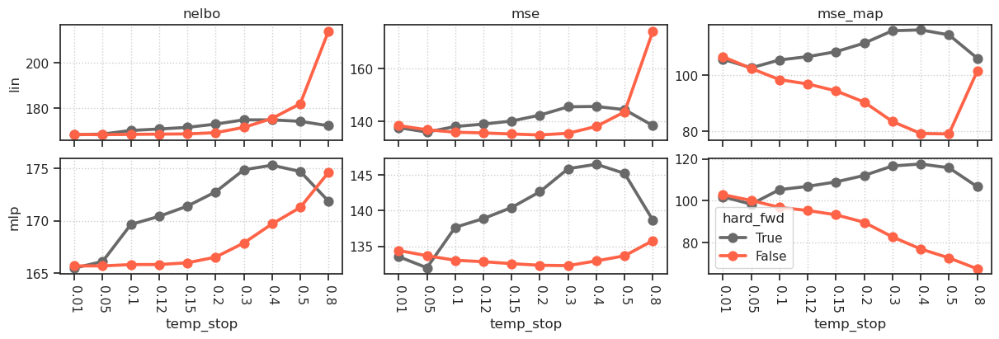

In [5]:
fig, axes = create_figure(2, 3, (12, 4), 'all')
for i, enc in enumerate(['lin', 'mlp']):
    _df = df.loc[df['enc_type'] == enc]
    for j, item in enumerate(['nelbo', 'mse', 'mse_map']):
        ax = axes[i, j]
        sns.pointplot(
            data=_df,
            x='temp_stop',
            hue='hard_fwd',
            palette={'True': 'dimgrey', 'False': 'tomato'},
            y=item,
            ax=ax,
        )
        # ax.set_ylim(
        #     _df[item].min() * 0.97,
        #     _df[item].max() * 1.02,
        # )
        ax.tick_params(axis='x', labelrotation=-90)
        ax.set_ylabel('')
        if i == 0:
            ax.set_title(item)
            ax.set_xlabel('')
        if i != 1 or j != 2:
            move_legend(ax)
        if j == 0:
            ax.set_ylabel(enc)
add_grid(axes)
plt.show()

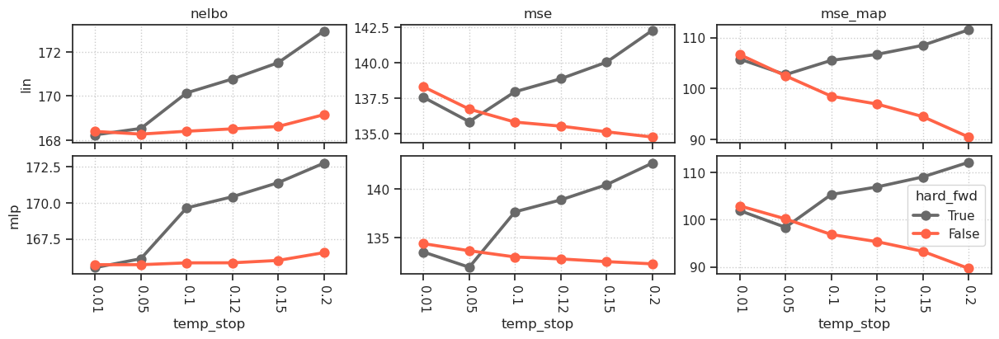

In [6]:
fig, axes = create_figure(2, 3, (12, 4), 'all')
for i, enc in enumerate(['lin', 'mlp']):
    _df = df.loc[
        (df['temp_stop'] < 0.3) &
        (df['enc_type'] == enc)
    ]
    for j, item in enumerate(['nelbo', 'mse', 'mse_map']):
        ax = axes[i, j]
        sns.pointplot(
            data=_df,
            x='temp_stop',
            hue='hard_fwd',
            palette={'True': 'dimgrey', 'False': 'tomato'},
            y=item,
            ax=ax,
        )
        # ax.set_ylim(
        #     _df[item].min() * 0.97,
        #     _df[item].max() * 1.02,
        # )
        ax.tick_params(axis='x', labelrotation=-90)
        ax.set(ylabel='')
        if i == 0:
            ax.set_title(item)
            ax.set_xlabel('')
        if i != 1 or j != 2:
            move_legend(ax)
        if j == 0:
            ax.set_ylabel(enc)
add_grid(axes)
plt.show()

In [7]:
df2p = df.loc[
    (df['temp_stop'] <= 0.3) &
    (df['hard_fwd'] == 'False')
]

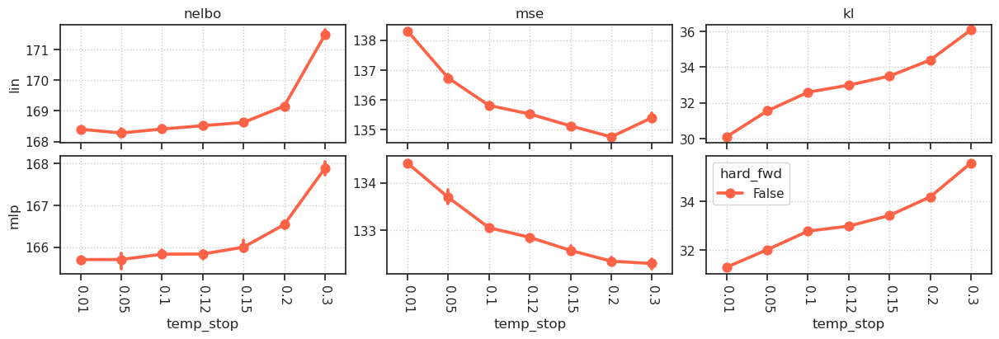

In [8]:
fig, axes = create_figure(2, 3, (12, 4), 'all')
for i, enc in enumerate(['lin', 'mlp']):
    _df = df2p.loc[df['enc_type'] == enc]
    for j, item in enumerate(['nelbo', 'mse', 'kl']):
        ax = axes[i, j]
        sns.pointplot(
            data=_df,
            x='temp_stop',
            hue='hard_fwd',
            palette={'True': 'dimgrey', 'False': 'tomato'},
            y=item,
            ax=ax,
        )
        # ax.set_ylim(
        #     _df[item].min() * 0.97,
        #     _df[item].max() * 1.02,
        # )
        ax.tick_params(axis='x', labelrotation=-90)
        ax.set(ylabel='')
        if i == 0:
            ax.set_title(item)
            ax.set_xlabel('')
        if i != 1 or j != 2:
            move_legend(ax)
        if j == 0:
            ax.set_ylabel(enc)
add_grid(axes)
plt.show()

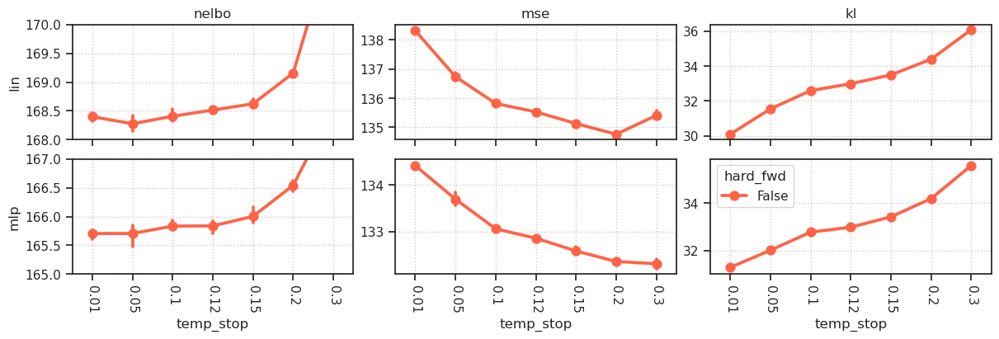

In [9]:
fig, axes = create_figure(2, 3, (12, 4), 'all')
for i, enc in enumerate(['lin', 'mlp']):
    _df = df2p.loc[df['enc_type'] == enc]
    for j, item in enumerate(['nelbo', 'mse', 'kl']):
        ax = axes[i, j]
        sns.pointplot(
            data=_df,
            x='temp_stop',
            hue='hard_fwd',
            palette={'True': 'dimgrey', 'False': 'tomato'},
            y=item,
            ax=ax,
        )
        # ax.set_ylim(
        #     _df[item].min() * 0.97,
        #     _df[item].max() * 1.02,
        # )
        ax.tick_params(axis='x', labelrotation=-90)
        ax.set(ylabel='')
        if i == 0:
            ax.set_title(item)
            ax.set_xlabel('')
        if i != 1 or j != 2:
            move_legend(ax)
        if j == 0:
            ax.set_ylabel(enc)
axes[0, 0].set_ylim((168, 170))
axes[1, 0].set_ylim((165, 167))
add_grid(axes)
plt.show()

### Table summaries

In [10]:
df.pivot_table(values='nelbo', index='temp_stop', columns=['enc_type', 'hard_fwd'])

enc_type          lin                     mlp            
hard_fwd        False        True       False        True
temp_stop                                                
0.01       168.399292  168.243103  165.705963  165.503555
0.05       168.276962  168.534576  165.706909  166.124695
0.10       168.407394  170.142807  165.834610  169.649643
0.12       168.515060  170.770767  165.839096  170.422318
0.15       168.622604  171.507431  166.002182  171.396606
0.20       169.155991  172.942078  166.542236  172.752975
0.30       171.488037  174.826721  167.889023  174.854431
0.40       175.430893  174.799927  169.702682  175.293503
0.50       181.958176  174.179855  171.275101  174.692871
0.80       214.019608  172.203995  174.621948  171.863297

In [11]:
df.pivot_table(values='mse', index='temp_stop', columns=['enc_type', 'hard_fwd'])

enc_type          lin                     mlp            
hard_fwd        False        True       False        True
temp_stop                                                
0.01       138.306793  137.563736  134.414108  133.557114
0.05       136.733734  135.843994  133.693176  132.005783
0.10       135.816116  137.961777  133.056351  137.658691
0.12       135.529953  138.877121  132.854141  138.877625
0.15       135.130692  140.045181  132.579391  140.427628
0.20       134.762878  142.286423  132.353165  142.628036
0.30       135.408066  145.444992  132.303696  145.848984
0.40       138.011108  145.564346  132.967911  146.468216
0.50       143.513992  144.359299  133.678955  145.183517
0.80       174.095230  138.314529  135.797714  138.653610

## Plot dictionary elements

In [12]:
grids = {}
for name in tqdm(fits):
    if 'mach-1' not in name:
        continue
    tr, meta = load_quick(
        pjoin(add_home(root), name),
        device=device,
        verbose=False,
        lite=True,
    )
    data, loss, etc = tr.validate()
    w = tr.model.fc_dec.weight.data.T.reshape(-1, 16, 16)
    w = tonp(w)[np.argsort(loss['kl_diag'])]
    key = (
        tr.model.cfg.enc_type,
        'hard' if tr.model.cfg.hard_fwd else 'soft',
        tr.cfg.temp_stop,
    )
    grids[key] = make_grid(
        x=w,
        grid_size=(16, 32),
        normalize=True,
        method='min-max',
    )
len(grids)

100%|████████████████████████████████████████████████████████████████████████████████████████████| 120/120 [00:26<00:00,  4.50it/s]


40

In [13]:
enc_str, hard_str, temp_stop = [sorted(set(e)) for e in zip(*grids)]
print(enc_str, hard_str, temp_stop)

['lin', 'mlp']
['hard', 'soft']
[0.01, 0.05, 0.1, 0.12, 0.15, 0.2, 0.3, 0.4, 0.5, 0.8]

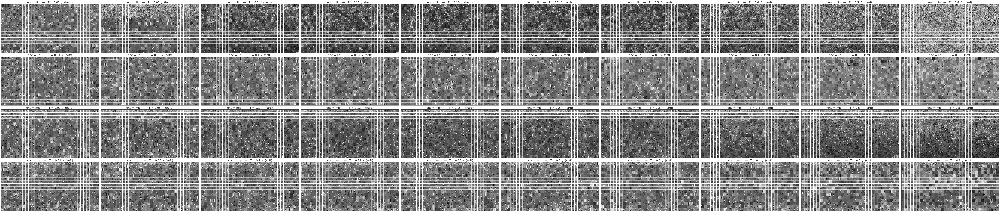

In [14]:
nrows = len(enc_str) * len(hard_str)
ncols = len(temp_stop)

fig, axes = create_figure(
    nrows=nrows,
    ncols=ncols,
    figsize=(9 * ncols, 1.9 * ncols),
    sharex='all',
    sharey='all',
)
remove_ticks(axes, False)

for i, temp in enumerate(temp_stop):
    for j, (enc, hardness) in enumerate(itertools.product(enc_str, hard_str)):
        ax = axes[j, i]
        ax.imshow(
            grids[(enc, hardness, temp)],
            cmap='Greys_r',
            vmin=0,
            vmax=1,
        )
        tit = f"enc = {enc}   —   T = {temp:0.2g}  /  ({hardness})"
        ax.set_title(tit, fontsize=18)
fig.savefig(pjoin(fig_base_dir, 'phi_temp.pdf'), bbox_inches='tight')
plt.show()

## Rate vs. orientation: 2 examples
One ```Lin``` and one ```MLP``` example, both: ```temp = 0.1```

### Lin — soft+t0.1

In [4]:
name = next(f for f in fits if 'soft+t0.1' in f and '<lin|lin>' in f)
print(name)

poisson-<lin|lin>-vH16-soft+t0.12_mach-1_(2024_07_15,19:09)

In [5]:
tr, meta = load_quick(
    pjoin(add_home(root), name),
    device=device,
    verbose=False,
    lite=True,
)
prior_log_rate = tonp(tr.model.log_rate.squeeze())
data, loss, etc = tr.validate()

print(f"{tr.model.cfg.name()}\n{tr.cfg.name()}")

poisson_uniform_c(-4)_vH16_z-512_fp_<lin|lin>_seed-1
mc_b1000-ep3000-lr(0.005)_beta(1:0x0.5)_temp(0.12:lin-0.5)_gr(500)

#### Find dead neurons

In [6]:
dead_thres = 0.01
dead = np.logical_or(
    loss['kl_diag'] < dead_thres,
    prior_log_rate > 1.0,
)
dead.sum()

6

#### Plot kl / log rate

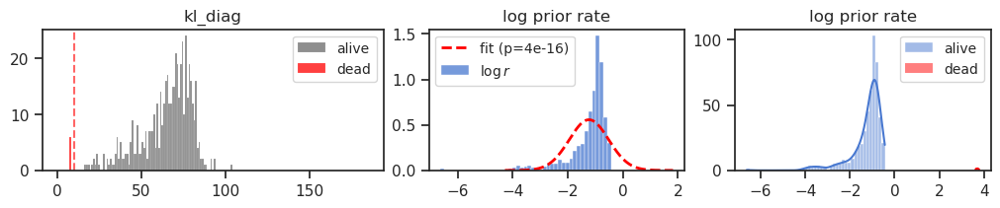

In [7]:
plot_kl_log_rates(dead_thres=dead_thres)

#### The other method for dead neurons

In [8]:
dead = tr.find_dead_neurons(kl=loss['kl_diag'])
dead.sum()

6

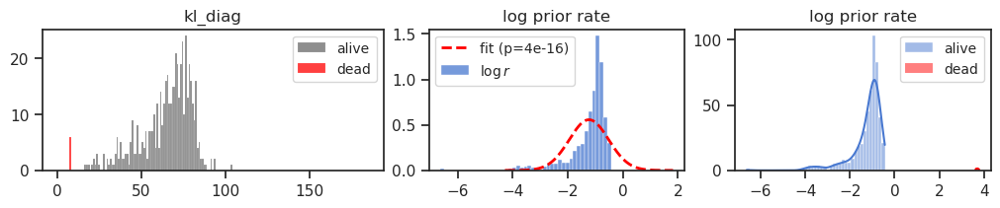

In [9]:
plot_kl_log_rates()

#### Fit loggabor

In [10]:
results = fit_loggabor(tr, verbose=True)

100%|███████████| 512/512 [00:19<00:00, 26.47it/s]


In [11]:
results.loc[results['sf_0'] > 10, 'sf_0'] = np.nan
results.iloc[np.logical_or(dead, np.isnan(results['theta']))] = np.nan
results.describe()

,x_pos,y_pos,theta,sf_0,phase,B_sf,B_theta,theta_deg,kl,prior_rate
count,504.000000,504.000000,504.000000,502.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000
mean,7.452024,7.495961,0.007788,0.265079,-0.089274,0.466242,0.418761,91.874792,0.065240,0.344239
std,3.986186,4.188324,1.007727,0.088662,1.307107,0.345453,0.473455,46.965017,0.014794,0.142011
min,0.391066,0.271387,-1.570796,0.088350,-5.238232,0.060131,0.073546,0.225499,0.017446,0.016960
25%,4.030548,3.809759,-0.917936,0.218963,-0.885089,0.356678,0.226895,54.991860,0.057539,0.255550
50%,7.251725,7.363793,-0.013363,0.257396,-0.152916,0.434034,0.325134,93.847811,0.068820,0.371404
75%,10.771768,11.047740,0.940907,0.292635,0.710152,0.509873,0.485060,128.630399,0.076141,0.443495
max,14.657301,14.739676,1.570796,0.964994,3.977614,7.419360,5.742322,179.789643,0.103297,0.648086


#### perform statistical test

In [12]:
u_test, t_test, cardinal_ratio = perform_test()
print(f"cardinal ratio: {cardinal_ratio:0.3g}\n\n{t_test}\n{u_test}")

cardinal ratio: 0.524

TtestResult(statistic=-9.862404376814732, pvalue=4.322931106646332e-21, df=502.0)
MannwhitneyuResult(statistic=17961.0, pvalue=4.417457892759626e-17)

#### plot results

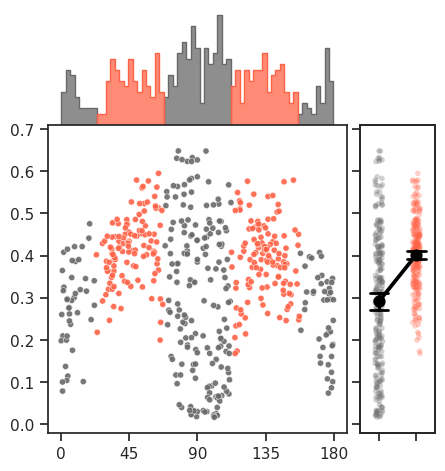

In [13]:
fig, _ = plot_theta(results)

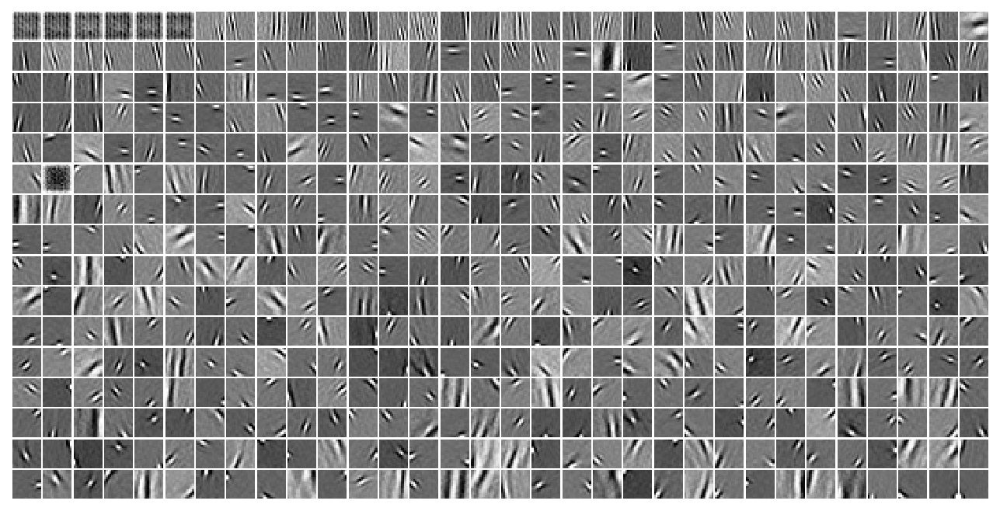

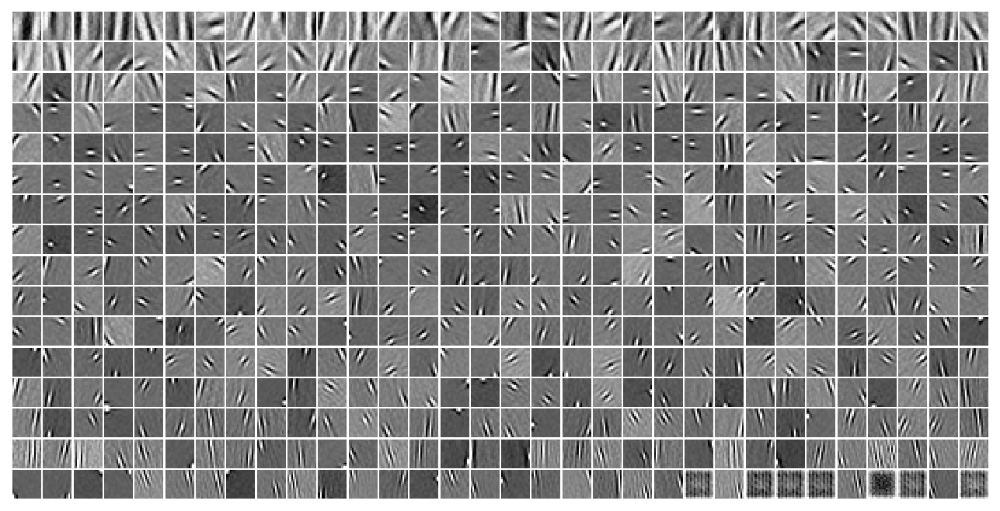

In [14]:
_ = tr.model.show(order=np.argsort(loss['kl_diag']))
_ = tr.model.show(order=np.argsort(results['sf_0'].values))

### MLP — soft+t0.1

In [15]:
name = next(f for f in fits if 'soft+t0.1' in f and '<mlp+b|lin>' in f)
print(name)

poisson-<mlp+b|lin>-vH16-soft+t0.12_mach-1_(2024_07_15,18:01)

In [16]:
tr, meta = load_quick(
    pjoin(add_home(root), name),
    device=device,
    verbose=False,
    lite=True,
)
prior_log_rate = tonp(tr.model.log_rate.squeeze())
data, loss, etc = tr.validate()

print(f"{tr.model.cfg.name()}\n{tr.cfg.name()}")

poisson_uniform_c(-4)_vH16_z-512_k-16_fp_<mlp+b|lin>_seed-1
mc_b1000-ep3000-lr(0.005)_beta(1:0x0.5)_temp(0.12:lin-0.5)_gr(500)

#### Find dead neurons

In [17]:
dead_thres = 0.01
dead = np.logical_or(
    loss['kl_diag'] < dead_thres,
    prior_log_rate > 1.0,
)
dead.sum()

25

#### Plot kl / log rate

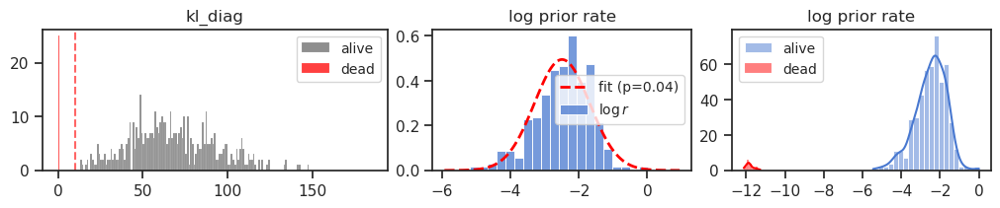

In [18]:
plot_kl_log_rates(dead_thres=dead_thres)

#### The other method for dead neurons

In [19]:
dead = tr.find_dead_neurons(kl=loss['kl_diag'])
dead.sum()

25

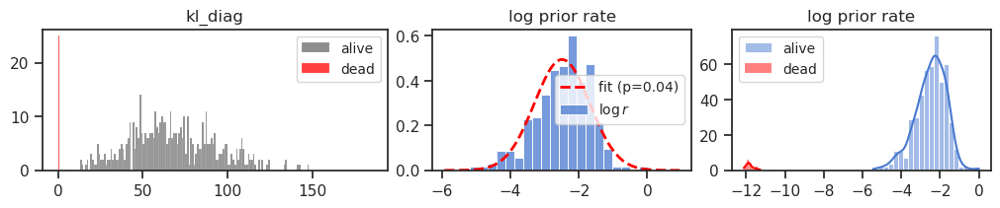

In [20]:
plot_kl_log_rates()

#### Fit loggabor

In [21]:
results = fit_loggabor(tr, verbose=True)

  8%|▉           | 39/512 [00:01<00:17, 26.67it/s]

 12%|█▌          | 64/512 [00:02<00:13, 32.42it/s]

 52%|█████▋     | 267/512 [00:10<00:20, 11.94it/s]

100%|███████████| 512/512 [00:21<00:00, 24.14it/s]


In [22]:
results.loc[results['sf_0'] > 10, 'sf_0'] = np.nan
results.iloc[np.logical_or(dead, np.isnan(results['theta']))] = np.nan
results.describe()

,x_pos,y_pos,theta,sf_0,phase,B_sf,B_theta,theta_deg,kl,prior_rate
count,4.830000e+02,4.830000e+02,483.000000,483.000000,483.000000,483.000000,483.000000,483.000000,483.000000,483.000000
mean,7.494079e+00,7.361196e+00,-0.008410,0.279916,-0.127222,0.541631,0.292229,93.431161,0.067775,0.110127
std,3.744163e+00,4.155062e+00,0.999112,0.166718,1.154630,0.198361,0.232784,47.726790,0.025352,0.093048
min,2.431122e-11,2.288083e-07,-1.570796,0.085799,-4.705998,0.069572,0.070993,0.195671,0.013417,0.004257
25%,4.700448e+00,3.699262e+00,-0.928106,0.226860,-0.696211,0.450045,0.136850,57.659040,0.049197,0.051887
50%,7.589544e+00,7.160488e+00,-0.036798,0.249542,-0.147326,0.502284,0.213074,94.640895,0.065525,0.091992
75%,1.011281e+01,1.079175e+01,0.934686,0.293698,0.523034,0.605807,0.343541,131.895264,0.085940,0.148141
max,1.475800e+01,1.518390e+01,1.570796,2.875495,6.201648,1.648166,1.837943,179.926302,0.147475,1.002831


#### perform statistical test

In [23]:
u_test, t_test, cardinal_ratio = perform_test()
print(f"cardinal ratio: {cardinal_ratio:0.3g}\n\n{t_test}\n{u_test}")

cardinal ratio: 0.526

TtestResult(statistic=-8.887685083838697, pvalue=1.2559993579329163e-17, df=481.0)
MannwhitneyuResult(statistic=15414.0, pvalue=4.501916824100523e-19)

#### plot results

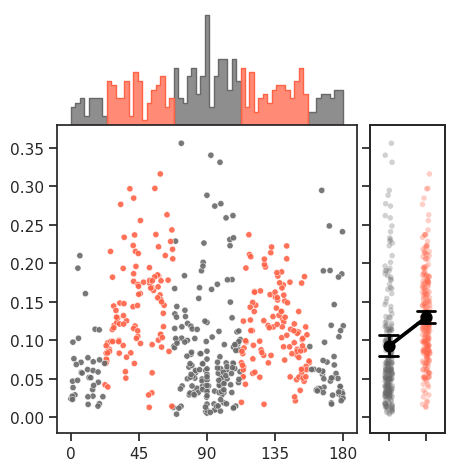

In [24]:
fig, _ = plot_theta(results, ylim_upper=0.38)

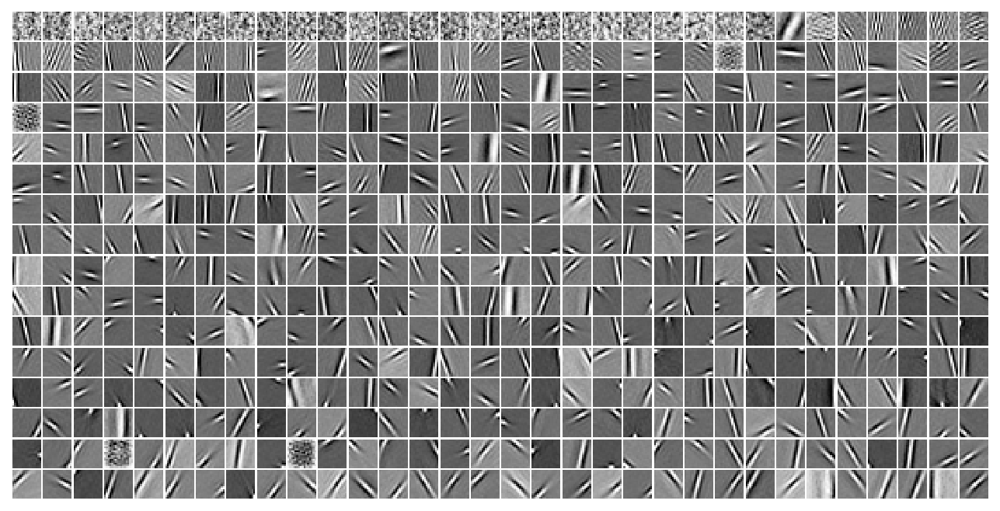

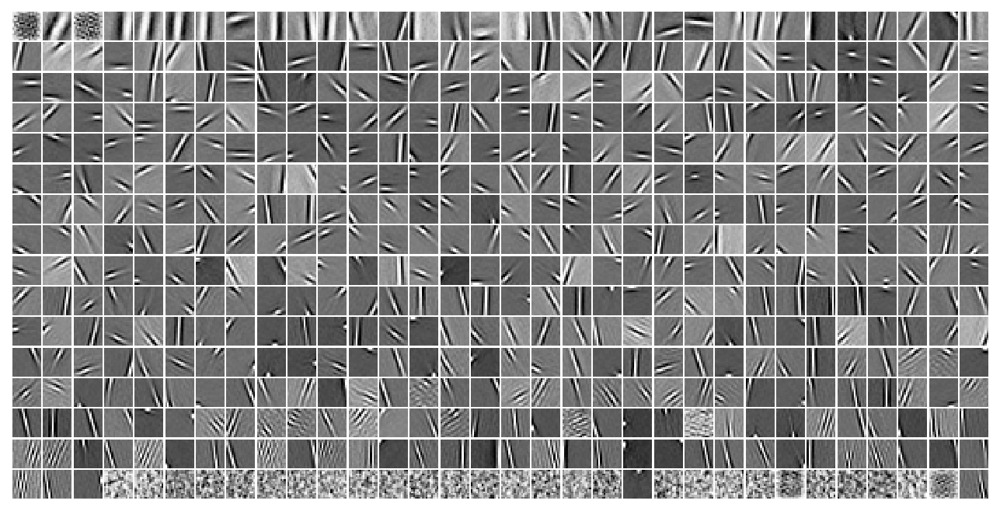

In [25]:
_ = tr.model.show(order=np.argsort(loss['kl_diag']))
_ = tr.model.show(order=np.argsort(results['sf_0'].values))

## Rate vs. orientation: full stats
Looper over all fits

### Run this code to generate results

Takes around 54 min

In [ ]:
%%time

df = []
for idx, name in tqdm(enumerate(fits), total=len(fits)):
    tr, meta = load_quick(
        pjoin(add_home(root), name),
        device=device,
        verbose=False,
        lite=True,
    )
    data, loss, etc = tr.validate()
    dead = tr.find_dead_neurons(kl=loss['kl_diag'])
    if dead.sum() > 100:
        dead = np.zeros(len(dead), dtype=bool)
    prior_log_rate = tonp(tr.model.log_rate.squeeze())
    rv, ks_test = fit_norm(prior_log_rate[~dead])

    results, _ = fit_loggabor(tr, add_kl=False, verbose=False)
    results.loc[results['sf_0'] > 10, 'sf_0'] = np.nan
    results.iloc[np.logical_or(dead, np.isnan(results['theta']))] = np.nan

    u_test, t_test, cardinal_ratio = perform_test()

    vals = {
        'enc_type': tr.model.cfg.enc_type,
        'hard_fwd': str(tr.model.cfg.hard_fwd),
        'temp_stop': tr.cfg.temp_stop,
        'seed': tr.model.cfg.seed,
        'num_dead_neurons': dead.sum(),
        'prior_rate_mu': np.exp(prior_log_rate[~dead]).mean(),
        'prior_rate_sd': np.exp(prior_log_rate[~dead]).std(),
        'cardinal_ratio': cardinal_ratio,
        'ks_statistic_sign': ks_test.statistic_sign,
        't_statistic': t_test.statistic,
        'u_statistic': u_test.statistic,
        'ks_pvalue': ks_test.pvalue,
        't_pvalue': t_test.pvalue,
        'u_pvalue': u_test.pvalue,
    }
    df.append({
        k: [v] for k, v
        in vals.items()
    })

df = pd.DataFrame(merge_dicts(df))

In [5]:
save_obj(
    obj=df,
    file_name='df_loggabor',
    save_dir=tmp_dir,
    verbose=True,
    mode='df',
)

[PROGRESS] 'df_loggabor.df' saved at
/home/hadi/Dropbox/git/jb-vae/tmp

### Load df and analyze

In [11]:
df = pd.read_pickle(pjoin(tmp_dir, 'df_loggabor.df'))

In [12]:
df

,enc_type,hard_fwd,temp_stop,seed,num_dead_neurons,prior_rate_mu,prior_rate_sd,cardinal_ratio,ks_statistic_sign,t_statistic,u_statistic,ks_pvalue,t_pvalue,u_pvalue
0,lin,True,0.01,1,5,0.287401,0.206358,0.494071,-1,-6.858561,21949.0,1.749554e-07,2.044031e-11,9.838169e-10
1,lin,True,0.01,2,6,0.282503,0.120433,0.523904,-1,-7.403488,21201.0,3.957045e-05,5.667905e-13,2.966024e-10
2,lin,True,0.01,3,6,0.285340,0.132946,0.517857,-1,-7.978348,19038.5,8.732322e-06,1.012851e-14,8.708368e-15
3,lin,True,0.05,1,6,1.552391,0.323788,0.574949,1,-3.066985,24455.0,9.388320e-14,2.283098e-03,3.208241e-03
4,lin,True,0.05,2,7,1.552536,0.328641,0.601626,1,-4.030028,21679.0,1.493553e-12,6.464311e-05,2.065772e-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,mlp,False,0.50,2,4,0.185847,0.106776,0.569697,-1,-8.091163,17809.0,9.083972e-04,4.637721e-15,8.650748e-15
116,mlp,False,0.50,3,5,0.185768,0.107325,0.557344,-1,-8.071912,15830.0,4.121699e-04,5.291140e-15,3.398434e-20
117,mlp,False,0.80,1,18,0.267844,0.123735,0.598291,-1,-6.854945,16528.0,5.720408e-13,2.271402e-11,8.703612e-12
118,mlp,False,0.80,2,9,0.256698,0.121648,0.609603,-1,-8.088092,15567.0,3.311107e-07,5.052356e-15,2.021258e-15


In [13]:
display(df.pivot_table(values=['ks_pvalue'], index='temp_stop', columns=['enc_type', 'hard_fwd']))
display(df.pivot_table(values=['t_pvalue'], index='temp_stop', columns=['enc_type', 'hard_fwd']))
display(df.pivot_table(values=['u_pvalue'], index='temp_stop', columns=['enc_type', 'hard_fwd']))

ks_pvalue                                          
enc_type            lin                         mlp              
hard_fwd          False          True         False          True
temp_stop                                                        
0.01       2.948369e-05  1.615924e-05  2.055208e-03  4.425153e-03
0.05       3.483445e-08  6.703621e-13  1.095652e-01  6.151879e-05
0.10       3.228650e-11  7.470820e-19  6.260335e-02  5.835655e-38
0.12       6.773783e-12  2.005471e-30  1.414497e-01  1.991438e-03
0.15       2.083429e-11  7.524598e-39  9.086049e-02  4.378546e-46
0.20       7.901757e-15  1.868396e-24  2.519809e-02  2.898089e-01
0.30       1.625671e-15  2.757434e-01  8.815193e-02  8.372293e-01
0.40       5.136039e-17  8.416954e-03  2.358385e-03  4.177144e-09
0.50       5.575641e-21  1.166223e-02  4.463674e-04  2.821757e-28
0.80       7.976014e-04  6.114586e-02  1.103807e-07  1.294462e-01

t_pvalue                                          
enc_type            lin                         mlp              
hard_fwd          False          True         False          True
temp_stop                                                        
0.01       7.025646e-12  7.005743e-12  3.405769e-12  1.719414e-12
0.05       7.416754e-18  8.087258e-04  4.933185e-12  7.910032e-18
0.10       4.946337e-20  2.559946e-01  1.815200e-14  1.219617e-05
0.12       9.400050e-19  3.091229e-01  9.744329e-17  1.552433e-04
0.15       2.009043e-16  6.898884e-01  2.610555e-16  3.004747e-01
0.20       1.569419e-19  6.673055e-01  7.130638e-16  3.308467e-07
0.30       1.207951e-15  8.315828e-01  2.812479e-20  1.341295e-03
0.40       2.572129e-10  3.388014e-01  3.316749e-16  1.463997e-03
0.50       7.763543e-08  1.501493e-01  3.309630e-15  3.986420e-04
0.80       7.305702e-09  8.279985e-03  7.698966e-12  1.279881e-06

u_pvalue                                          
enc_type            lin                         mlp              
hard_fwd          False          True         False          True
temp_stop                                                        
0.01       1.672309e-12  4.268093e-10  9.357867e-15  4.966760e-15
0.05       2.423063e-14  1.087569e-03  2.372043e-18  9.694125e-22
0.10       2.310966e-16  5.067481e-06  1.748417e-18  8.662142e-20
0.12       2.782653e-17  3.941478e-08  1.600669e-19  3.762507e-31
0.15       1.915403e-14  1.044074e-05  6.604915e-19  5.995665e-18
0.20       8.225713e-18  2.897689e-03  1.507886e-16  1.605348e-07
0.30       8.056094e-20  8.875604e-01  1.714710e-22  3.025037e-04
0.40       1.818158e-19  6.329278e-01  8.218856e-20  6.967914e-02
0.50       4.438827e-19  2.532547e-01  2.883792e-15  1.164864e-03
0.80       1.538270e-10  2.433775e-02  2.971097e-12  3.786852e-07

In [14]:
df.pivot_table(values=['cardinal_ratio', 'num_dead_neurons'], index='temp_stop', columns=['enc_type', 'hard_fwd'])

cardinal_ratio                               num_dead_neurons  \
enc_type             lin                 mlp                        lin   
hard_fwd           False      True     False      True            False   
temp_stop                                                                 
0.01            0.517821  0.511944  0.526674  0.524001         3.666667   
0.05            0.528747  0.574378  0.520716  0.467522         6.000000   
0.10            0.527077  0.496438  0.538130  0.404353         5.333333   
0.12            0.532150  0.497373  0.520637  0.442324         6.333333   
0.15            0.536047  0.525390  0.523608  0.465667         6.666667   
0.20            0.531153  0.530220  0.526463  0.463570         7.333333   
0.30            0.567713  0.572710  0.545554  0.468528         6.666667   
0.40            0.583710  0.628814  0.549569  0.460272         4.000000   
0.50            0.569096  0.632151  0.565652  0.485017         1.000000   
0.80            0.588667  0.507576  0.610789  0.592186         2.000000   

                                           
enc_type                   mlp             
hard_fwd       True      False       True  
temp_stop                                  
0.01       5.666667  13.333333  13.333333  
0.05       4.333333  12.666667  12.666667  
0.10       0.666667  13.000000  15.333333  
0.12       1.333333  14.333333  15.666667  
0.15       1.333333  15.333333  15.666667  
0.20       0.333333  13.333333  13.666667  
0.30       2.333333  11.000000  11.000000  
0.40       1.000000  12.666667  12.666667  
0.50       1.000000  12.000000  12.000000  
0.80       3.000000  12.000000  12.000000

In [15]:
df.pivot_table(values=['prior_rate_mu', 'prior_rate_sd'], index='temp_stop', columns=['enc_type', 'hard_fwd'])

prior_rate_mu                                 prior_rate_sd  \
enc_type            lin                  mlp                      lin   
hard_fwd          False       True     False       True         False   
temp_stop                                                               
0.01           0.236265   0.285081  0.092794   0.108487      0.156821   
0.05           0.289294   1.559021  0.097246   0.523133      0.138621   
0.10           0.327722   4.485576  0.105004   4.040062      0.142235   
0.12           0.344841   5.676138  0.108801   5.477021      0.152203   
0.15           0.363093   7.436881  0.113336   7.397659      0.140900   
0.20           0.398294  10.260596  0.121837  10.330365      0.146583   
0.30           0.463937  14.382197  0.140606  15.134575      0.135176   
0.40           0.534215  14.473732  0.165679  16.233444      0.164435   
0.50           0.582090  12.822167  0.190422  14.743487      0.109882   
0.80           0.705372   8.186979  0.260852   8.024751      0.059236   

                                         
enc_type                  mlp            
hard_fwd       True     False      True  
temp_stop                                
0.01       0.153246  0.071076  0.081420  
0.05       0.335374  0.099301  0.348556  
0.10       0.480178  0.111058  0.803699  
0.12       0.459047  0.143675  0.500657  
0.15       0.433614  0.110534  0.629166  
0.20       0.395983  0.114643  0.207103  
0.30       0.317695  0.098128  0.140242  
0.40       0.120176  0.102590  0.122510  
0.50       0.070541  0.108091  0.099732  
0.80       0.030859  0.121154  0.024141

## Why mean prior rate so high?

For this model:
- enc = 'mlp+b'
- hard = True
- temp = 0.40

In [25]:
enc, temp = 'mlp+b', 0.40
name = next(f for f in fits if f"hard+t{temp}" in f and f"<{enc}|lin>" in f)
print(name)

poisson-<mlp+b|lin>-vH16-hard+t0.4_mach-1_(2024_07_15,22:30)

In [26]:
tr, meta = load_quick(
    pjoin(add_home(root), name),
    device=device,
    verbose=False,
    lite=True,
)
prior_log_rate = tonp(tr.model.log_rate.squeeze())
data, loss, etc = tr.validate()

print(f"{tr.model.cfg.name()}\n{tr.cfg.name()}")

poisson_uniform_c(-4)_hard_vH16_z-512_k-16_fp_<mlp+b|lin>_seed-1
mc_b1000-ep3000-lr(0.005)_beta(1:0x0.5)_temp(0.4:lin-0.5)_gr(500)

#### Find dead neurons

In [27]:
dead = tr.find_dead_neurons(kl=loss['kl_diag'])
dead.sum()

26

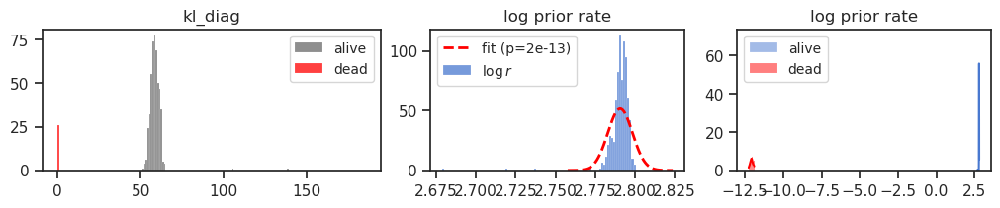

In [28]:
plot_kl_log_rates()

In [29]:
np.exp(prior_log_rate[~dead]).mean()

16.292156

#### Fit loggabor

In [32]:
results, _ = fit_loggabor(tr, verbose=False)

In [33]:
results.loc[results['sf_0'] > 10, 'sf_0'] = np.nan
results.iloc[np.logical_or(dead, np.isnan(results['theta']))] = np.nan
results.describe()

,x_pos,y_pos,theta,sf_0,phase,B_sf,B_theta,theta_deg,kl,prior_rate
count,4.820000e+02,4.820000e+02,482.000000,482.000000,482.000000,482.000000,482.000000,482.000000,482.000000,482.000000
mean,7.518340e+00,7.531931e+00,0.015740,0.220771,-0.126181,0.493445,0.748615,90.901860,0.058888,16.295662
std,4.072906e+00,4.278276e+00,1.051857,0.030319,0.841403,0.151537,1.237572,42.230616,0.004827,0.094007
min,2.098276e-08,4.790989e-08,-1.570796,0.125722,-5.646302,0.040303,0.059336,0.393668,0.051579,15.163969
25%,4.307191e+00,3.898129e+00,-0.973849,0.204197,-0.376910,0.425373,0.193813,58.975955,0.057011,16.264400
50%,7.315102e+00,7.490790e+00,0.002557,0.216067,-0.123558,0.476994,0.503192,90.000000,0.058525,16.304581
75%,1.088713e+01,1.128493e+01,1.018603,0.232213,0.109323,0.569191,0.860011,123.972210,0.060330,16.348049
max,1.600000e+01,1.600000e+01,1.570796,0.434926,4.888128,1.234451,10.372940,179.899295,0.138300,16.449810


#### perform statistical test

In [34]:
u_test, t_test, cardinal_ratio = perform_test()
print(f"cardinal ratio: {cardinal_ratio:0.3g}\n\n{t_test}\n{u_test}")

cardinal ratio: 0.452

TtestResult(statistic=-4.205810848900535, pvalue=3.104610835211779e-05, df=480.0)
MannwhitneyuResult(statistic=24705.5, pvalue=0.007492511837112996)

#### plot results

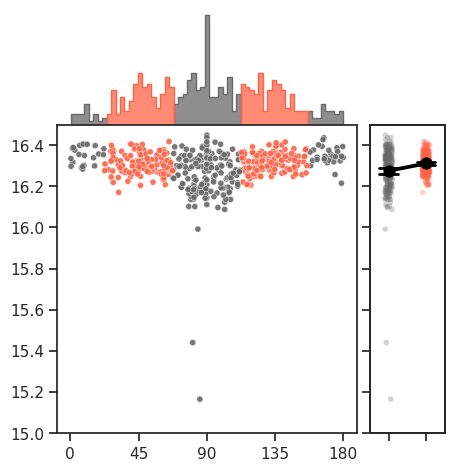

In [49]:
fig, _ = plot_theta(results, ylim_lower=15, ylim_upper=16.5)

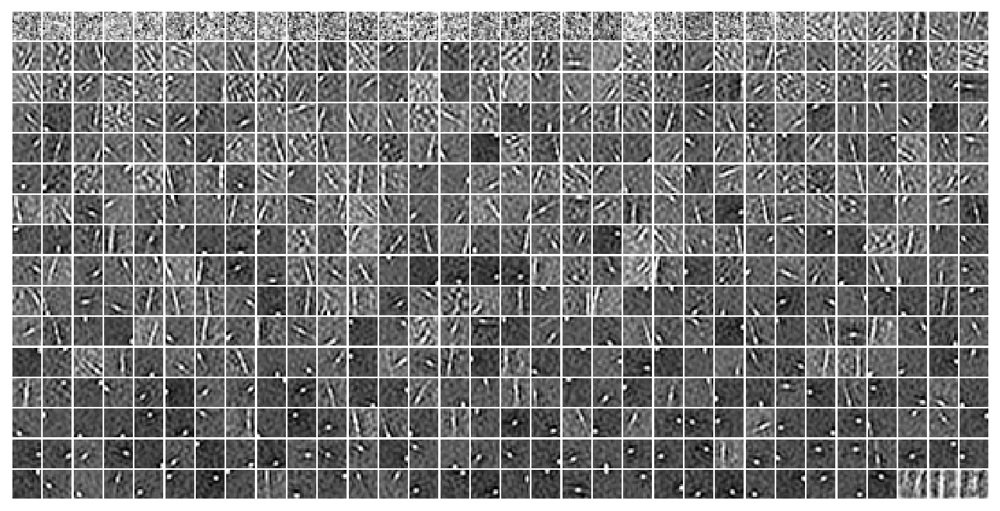

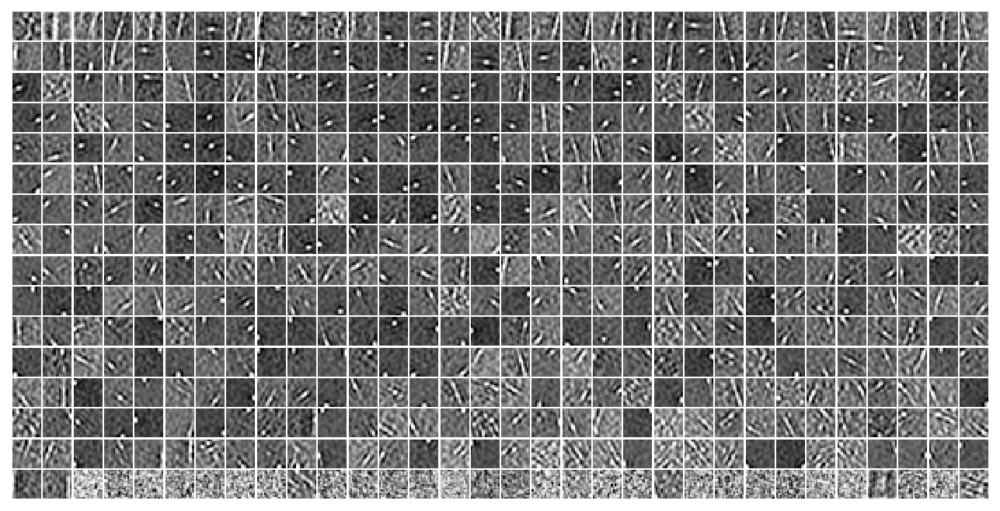

In [50]:
_ = tr.model.show(order=np.argsort(loss['kl_diag']))
_ = tr.model.show(order=np.argsort(results['sf_0'].values))